In [1]:
#import numpy as np
import numpy.random as npr

import jax
import jax.numpy as np # TODO: change to jnp
import jax.random as jrnd
import jax.scipy.stats as jsps
import jax.scipy.linalg as spla
from jax.config import config
config.update("jax_enable_x64", True)
from jax.scipy.stats import gaussian_kde

import tqdm
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

# Active phase mapping code

Next steps (as of 2/10/23):
* Switch out the model to use an arbitary kernel (use a package that makes it easy to optimize kernel hyperparameters later on)
* Implement on fake data from a 3-configuration setting 
* Implement visualization for 3-configuration setting (triangles?)
* Implement baseline for >1 dimensional examples
* Swap out the convex hull code (is it slow?)

In [2]:
## TODO: need to learn kernel hyperparameters
def kernel(x1, x2, ls):
    """
    Squared expoential kernel with lengthscale ls. 
    """
    x1 = np.atleast_2d(x1)
    x2 = np.atleast_2d(x2)
    return np.exp(-0.5*(x1.T-x2)**2/ls**2)


def make_preds(train_x, train_y, test_x):
    """
    Given data, get pred_mean and pred_cov. 
    """
    # Compute the training kernels.
    train_K = kernel(train_x, train_x, ls) + 1e-6*np.eye(train_x.shape[0])
    cross_K = kernel(train_x, test_x, ls)
    kappa_K = kernel(test_x, test_x, ls)

    # Predictive parameters.
    train_cK = spla.cholesky(train_K)
    cross_solve = spla.cho_solve((train_cK,  False), cross_K)
    pred_mean = train_y.T @ cross_solve
    pred_cov  = kappa_K - cross_K.T @ cross_solve + 1e-6*np.eye(knot_N)

    return pred_mean, pred_cov

d_kernel = jax.jit(jax.vmap(jax.grad(jax.grad(lambda x1, x2, ls: kernel(x1, x2, ls)[0,0], argnums=0), argnums=1), in_axes=(0,0,None)))

# Compute the convex envelope given x and y values
def convelope(knot_x, knot_y):
    # TODO: 
    deriv_marg_var = np.max(np.diag(d_kernel(knot_x, knot_x, ls)))
    s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)

    knot_y = np.atleast_2d(knot_y) # samples x num_primal
    sx = s[:,np.newaxis] * knot_x[np.newaxis,:] # num_dual x num_primal
    # compute the conjugate
    lft1 = np.max(sx[np.newaxis,:,:] - knot_y[:,np.newaxis,:],  axis=2) # samples x num_dual
    # compute the biconjugate
    lft2 = np.max(sx[np.newaxis,:,:] - lft1[:,:,np.newaxis],  axis=1) # samples x num_primal
    return lft2


def generate_true_function(knot_N, kernel, ls):
    knot_x = np.linspace(0, 1, knot_N)
    knot_K = kernel(knot_x, knot_x, ls) + 1e-8 * np.eye(knot_N)
    # Cholesky decomposition of the kernel matrix
    knot_cK = spla.cholesky(knot_K)
    # Form the true function of interest at knot_N number of points
    true_y = knot_cK.T @ npr.randn(knot_N)
    # compute envelope based on true function
    true_envelope = convelope(knot_x, true_y)
    
    return true_y, true_envelope

In [3]:
def elliptical_slice_jax(x0, log_lh_func, chol, num_samples, rng_key):
    """
    Jax implementation of ESS
    """

    @jax.jit
    def ess_step_condfun(state):
        x, new_x, nu, thresh, lower, upper, rng_key = state
        llh = log_lh_func(new_x)
        return log_lh_func(new_x) < thresh

    @jax.jit
    def ess_step_bodyfun(state):
        x, new_x, nu, thresh, lower, upper, rng_key = state
        theta_rng, rng_key = jrnd.split(rng_key, 2)
        theta = jrnd.uniform(theta_rng, minval=lower, maxval=upper)
        new_x = x * np.cos(theta) + nu * np.sin(theta)
        lower, upper = jax.lax.cond(theta < 0, lambda : (theta, upper), lambda : (lower, theta))
        return x, new_x, nu, thresh, lower, upper, rng_key

    @jax.jit
    def ess_step(x, rng_key):
        nu_rng, u_rng, theta_rng, rng_key = jrnd.split(rng_key, 4)
        nu = chol.T @ jrnd.normal(nu_rng, shape=x.shape)
        u = jrnd.uniform(u_rng)
        thresh = log_lh_func(x) + np.log(u)
        theta = jrnd.uniform(theta_rng, minval=0, maxval=2* np.pi)
        upper = theta
        lower = theta - 2* np.pi
        new_x = x * np.cos(theta) + nu * np.sin(theta)
        _, new_x, _, _, _, _, _ = jax.lax.while_loop(
          ess_step_condfun,
          ess_step_bodyfun,
          (x, new_x, nu, thresh, lower, upper, rng_key)
        )
        return new_x

    @jax.jit
    def scanfunc(state, xs):
        x, rng_key = state
        step_key, rng_key = jrnd.split(rng_key, 2)
        x = ess_step(x, step_key)
        return (x, rng_key), x

    _, samples = jax.lax.scan(scanfunc, (x0, rng_key), None, num_samples)

    return samples

In [4]:
def make_pred_single(train_x, train_y, test_x):
    # Compute the training kernels.
    train_K = kernel(train_x, train_x, ls) + 1e-6*np.eye(train_x.shape[0])
    cross_K = kernel(train_x, test_x, ls)
    kappa_K = kernel(test_x, test_x, ls)

    # Predictive parameters.
    train_cK = spla.cholesky(train_K)
    cross_solve = spla.cho_solve((train_cK,  False), cross_K)
    pred_mean = train_y.T @ cross_solve
    pred_cov  = kappa_K - cross_K.T @ cross_solve + 1e-6*np.eye(1)

    return pred_mean.ravel()[0], pred_cov.ravel()[0]


def estimate_entropy_cond_s(samps, putative_x, s, rng_key, J=50):
    """
    samps: samples of f's from ellipitical slice sampling
    s: binary vector of tights
    """
    totsamps = len(samps)
    test_samps = samps[totsamps-J:totsamps]
    
    # get 1d predictive y samples
    make_pred_single_wrap = lambda arg: make_pred_single(knot_x, arg, putative_x) ## TODO knot_x is global var here
    makepred_vmap = jax.jit(jax.vmap(make_pred_single_wrap, in_axes=(0,)))
    mus, sigmas = makepred_vmap(test_samps)
    ystars = jrnd.multivariate_normal(rng_key, mus, np.eye(sigmas.shape[0])*sigmas) # TODO: just rescale by cholesky + mean
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate


def ess_and_estimate_entropy(putative_x, s, y, cK, rng_key, J=50):
    """
    Get samples of function conditioned on tights, get samples of y preds conditioned on 
        these samples, and then estimate the entropy.
    """
    ## TODO: get rid of knot_cK?
    # sample J*3 number of points but only keep the last J 
    def same_tight(y, tight):
        new_hull = convelope(knot_x, y).ravel()
        new_tight = y - new_hull < 1e-3
        return np.all(tight == new_tight)

    samps_f = elliptical_slice_jax(y.ravel(), lambda x: np.log(same_tight(x, s)), cK, J*3, rng_key)
    return estimate_entropy_cond_s(samps_f, putative_x, s, rng_key, J)

In [15]:
def compute_IG_putative_x(putative_x, pred_cK, pred_Y, tights, rng_key, T=100, J=200):
    """
    Compute a Monte Carlo approximation of the IG w.r.t. T samples of s_t ~ p(s | data).
    
    The inner entropy is approximated via Monte Carlo + a KDE estimator constructed from the samples. 
    (TODO: don't use the same data twice)
    
    T: number of samples for the outer expectation
    J: number of ESS samples (controls the # of samples for the inner MC too?)
    """

    def entropy_est_wrap(args):
        tights_i, pred_Y_i = args
        ### TODO: is this the correct quantity to slice sample from?
        return ess_and_estimate_entropy(putative_x, tights_i, pred_Y_i, pred_cK, rng_key, J=J)
    ventropy_est = jax.jit(jax.vmap(entropy_est_wrap, in_axes=((1,1),)))
    
    entropies = ventropy_est((tights, pred_Y))       
    
    # estimate of the second term in the EIG
    return entropies.mean()
    

def get_next_candidate(data, designs, rng_key, T=30, J=40):
    """
    Given current data and a list of designs, computes a score for each design. 
    Returns the best design and the list of scores. 
    """

    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, T)
    tights = np.abs(envelopes.T - pred_Y) < 1e-3 ## NOTE: we transposed the shape from what it was before
    
    compute_IG_putative_wrap = lambda x: compute_IG_putative_x(x, pred_cK, pred_Y, tights, rng_key, T = T, J = J) 
    compute_IG_vmap = jax.vmap(compute_IG_putative_wrap, in_axes=0)
    
    curr_entropy = np.log(np.sqrt(2*np.pi*np.e*np.diag(pred_cov)))
    mean_entropy = compute_IG_vmap(designs)
    
    entropy_change = curr_entropy - mean_entropy
    return entropy_change.argmax(), entropy_change

def get_next_candidate_baseline(data, designs):
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, 20)
    
    train_x, train_y = data
    
    # TODO: update for non-1d example
    covariances = np.array([make_pred_single(train_x, train_y, x)[1] for x in designs])
    entropy_change = 0.5 * np.log(covariances + 1)
    return entropy_change.argmax(), entropy_change


def update_model(data, T):
    train_x, train_y = data
    # sample functions ~ posterior
    pred_mean, pred_cov = make_preds(train_x, train_y, knot_x) # what is knot_x? (right now it's a global variable)
    pred_cK = spla.cholesky(pred_cov)
    # get T samples from the posterior
    pred_Y = pred_cK.T @ npr.randn(knot_N, T) + pred_mean[:,np.newaxis] ## global variable
    # get s by computing the vector of tights w.r.t. posterior samples
    envelopes = convelope(knot_x, pred_Y.T)
    
    return pred_mean, pred_cov, pred_cK, pred_Y, envelopes


def plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, scores, plot_eig=True, legend=True, plot_hulls=True):
    train_x, train_y = data
    
    plt.figure(figsize=(10,4))

    # Plot true function, convex hull, and GP model mean + uncertainty
    plt.plot(knot_x, true_y, "k", lw=2, label="True function")
    plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
    plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
    y_err = np.sqrt(np.diag(pred_cov))
    plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
    
    if plot_hulls:
        # Plot convex hulls of posterior samples
        plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

    # Plot data / next evaluation
    plt.scatter(knot_x[next_x], true_y[next_x], marker="*", color="tab:red", zorder=5, sizes=[150], label="Next evaluation")
    plt.scatter(train_x, train_y, label="Observed data", c="k", zorder=5)

    # Plot the entropy estimates (i.e., -second term of EIG)
    if plot_eig:
        plt.scatter(knot_x, scores, c="purple", marker="|", label="EIG")
        
    if legend:
        plt.legend(ncol=2, fontsize=14)

    plt.ylim(-3,3); plt.xlabel("Composition space", fontsize=14); plt.ylabel("Energy", fontsize=14)
    
def add_observation(data, true_y, next_x):
    train_x, train_y = data
    train_x = np.concatenate([train_x, np.array([knot_x[next_x]])])
    train_y = np.concatenate([train_y, np.array([true_y[next_x]])])
    return (train_x, train_y)

def compute_distances(data, true_envelopes):
    distances = []
    for (i,x) in enumerate(data[0]):
        x_idx = (knot_x == x).argmax()
        distances.append(np.abs(data[1][i] - true_envelope[1][x_idx]))
    return np.array(distances)

# Example usage

Here we use T,J=50 MC samples.

In [6]:
# Define some global variables

# Number of points to discretize the space into
knot_N = 40
# grid to discretize design space into
knot_x = np.linspace(0, 1, knot_N)

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8


DeviceArray(0.38053528, dtype=float64)

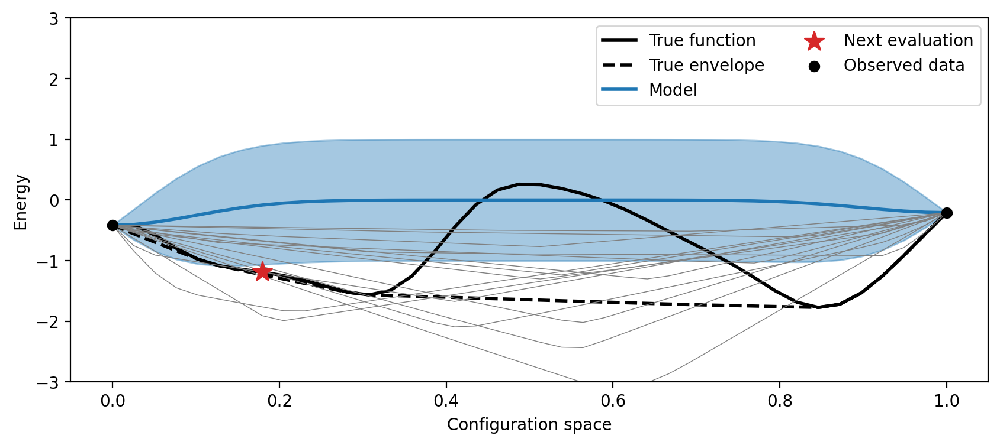

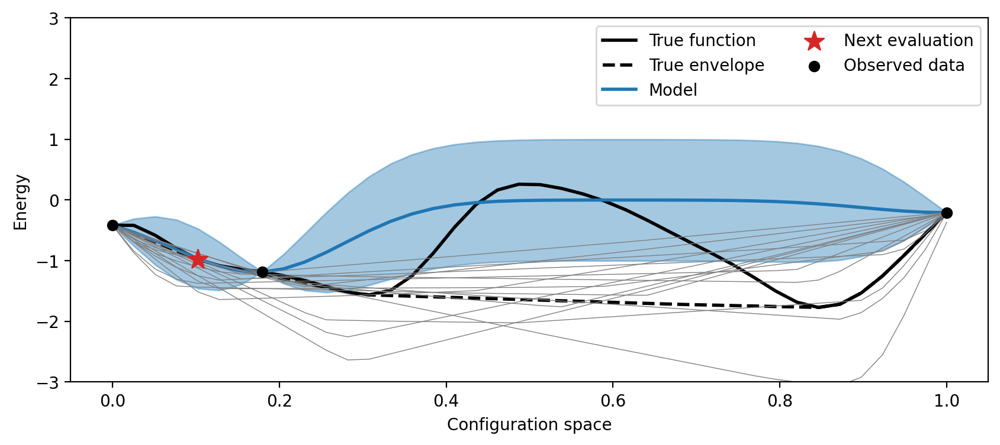

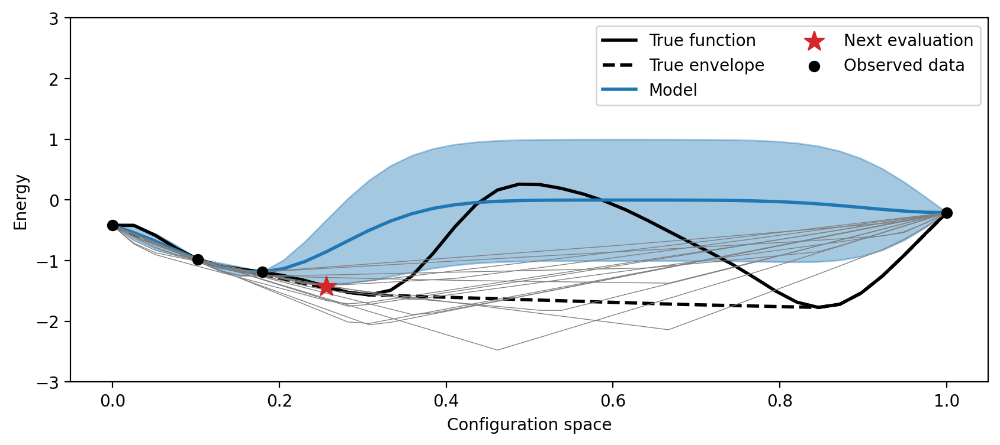

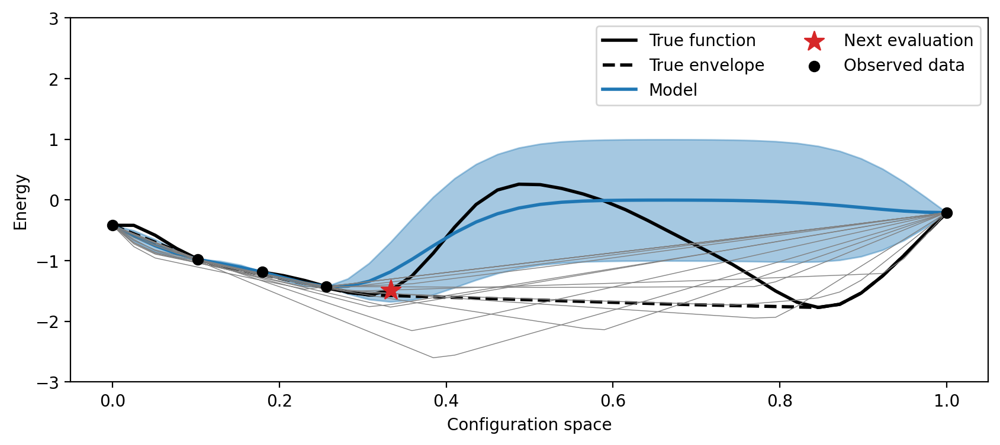

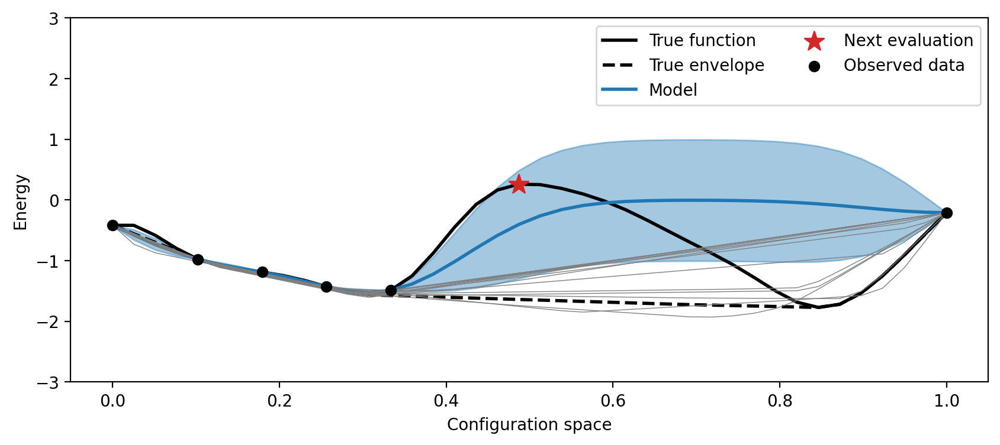

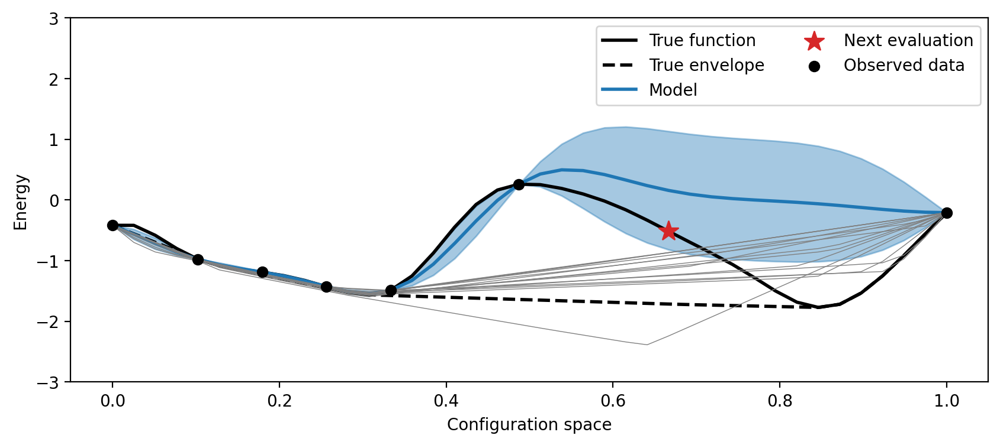

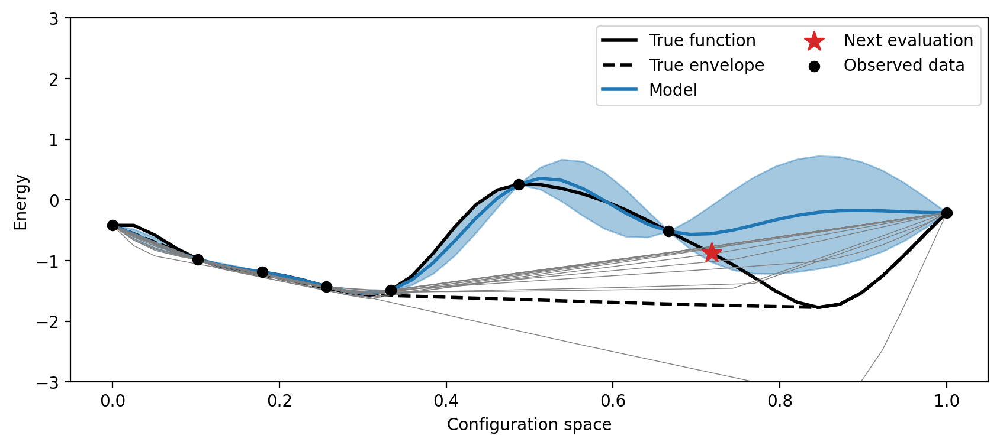

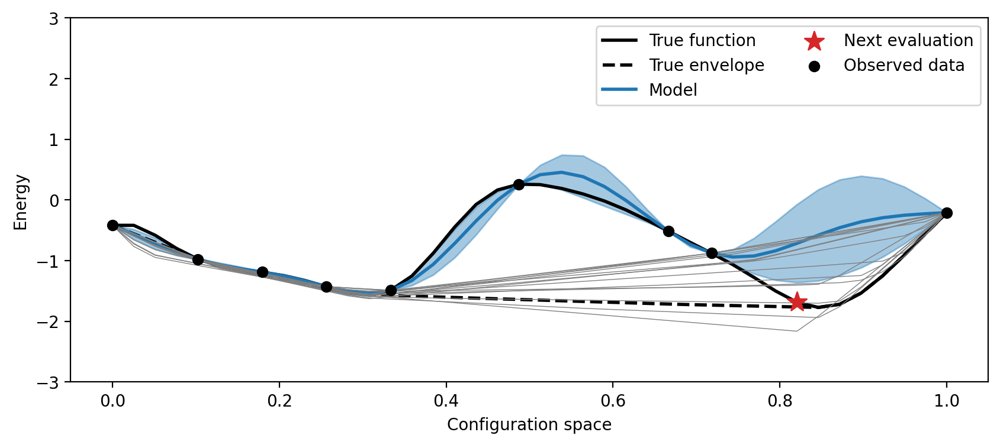

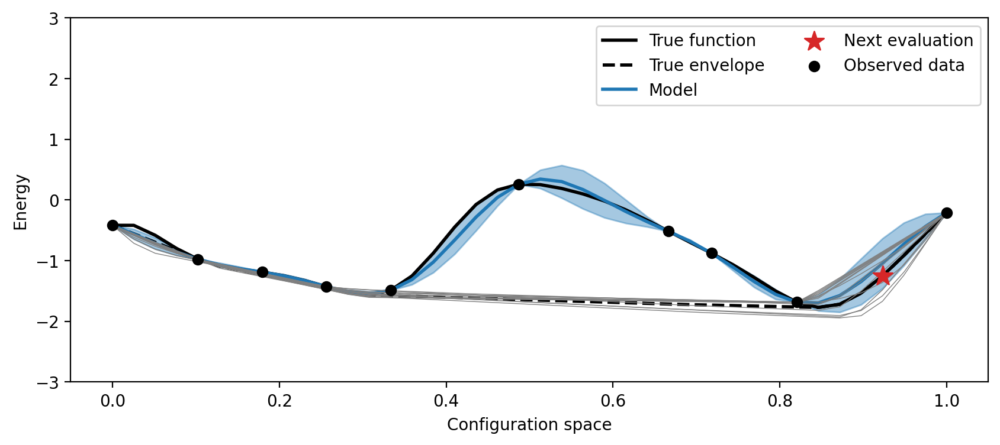

In [78]:
# Set random seed
npr.seed(2)
# Length scale for the kernel
ls = 0.1
true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

rng_key = jrnd.PRNGKey(1)

num_iters = 9

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances = compute_distances(data, true_envelope)
distances.mean()

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8


DeviceArray(0.51340004, dtype=float64)

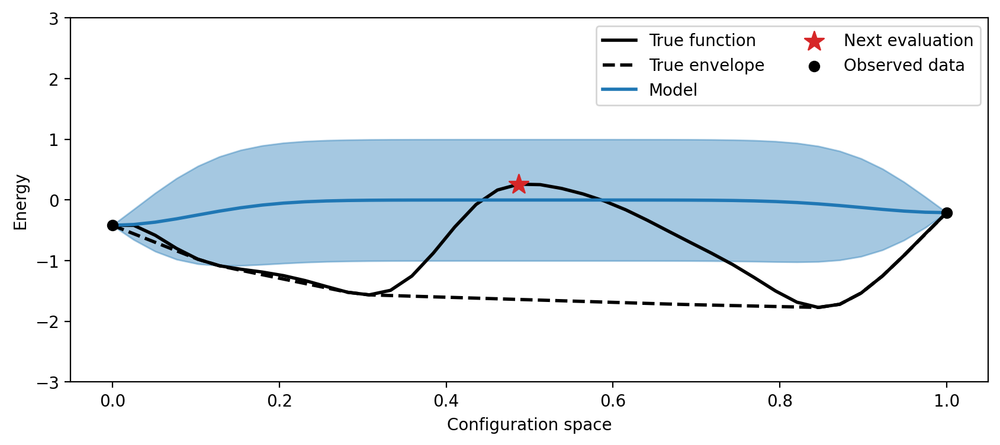

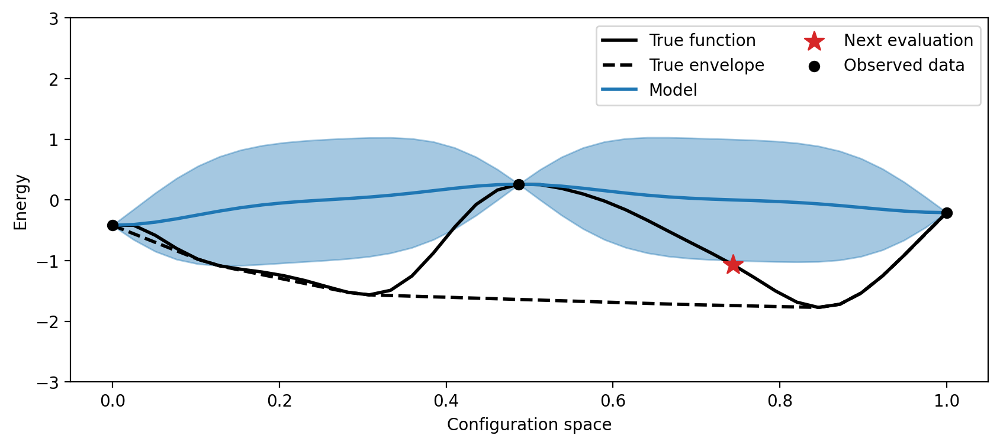

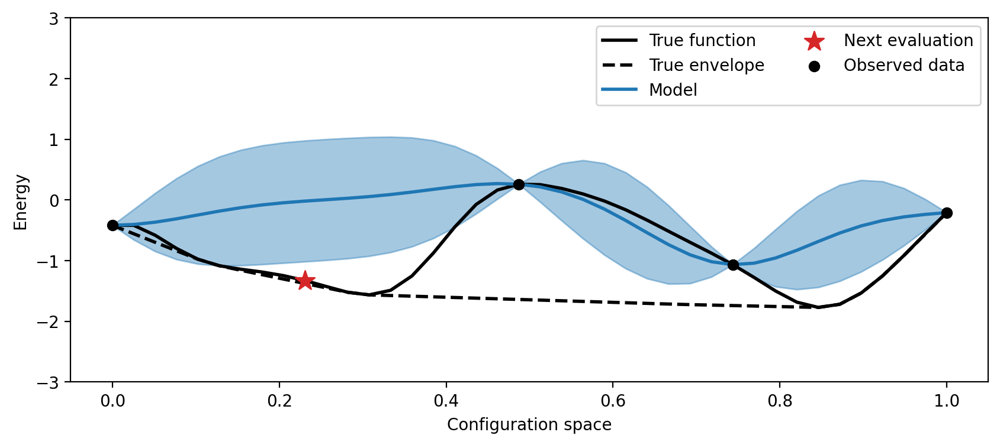

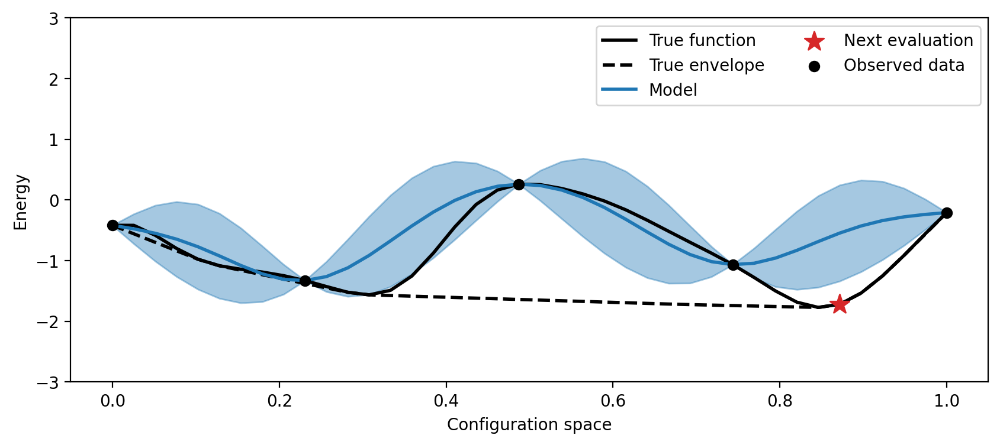

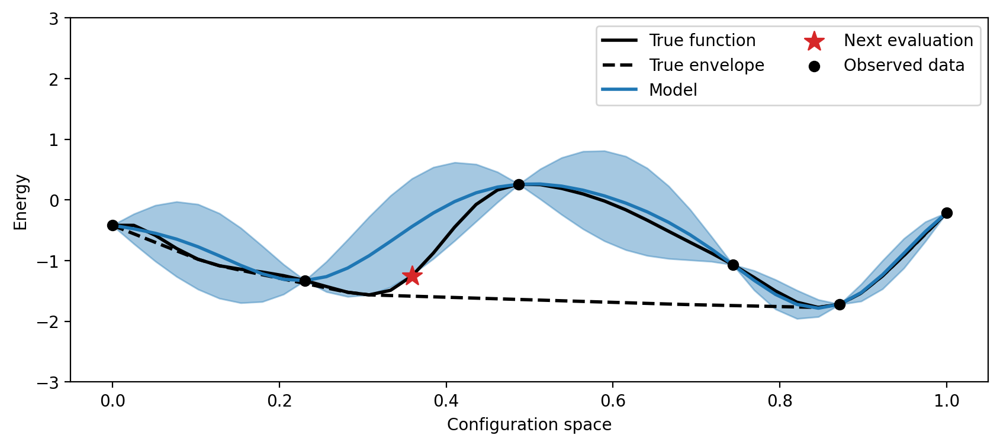

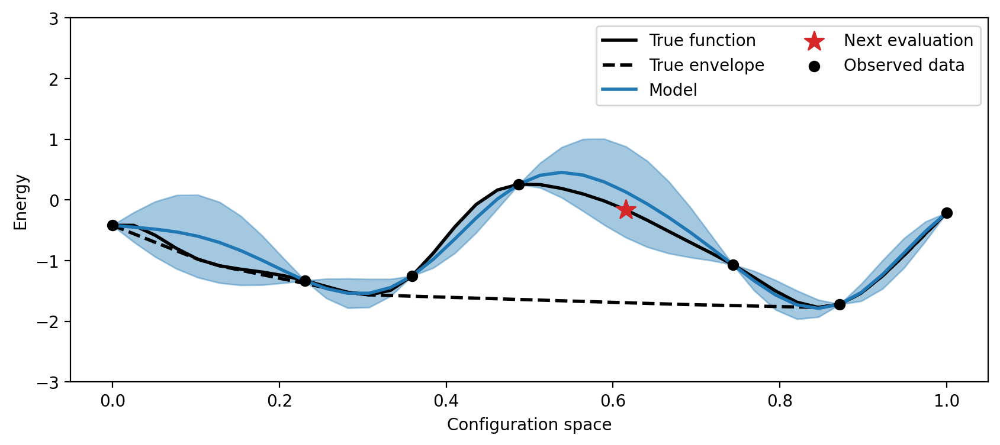

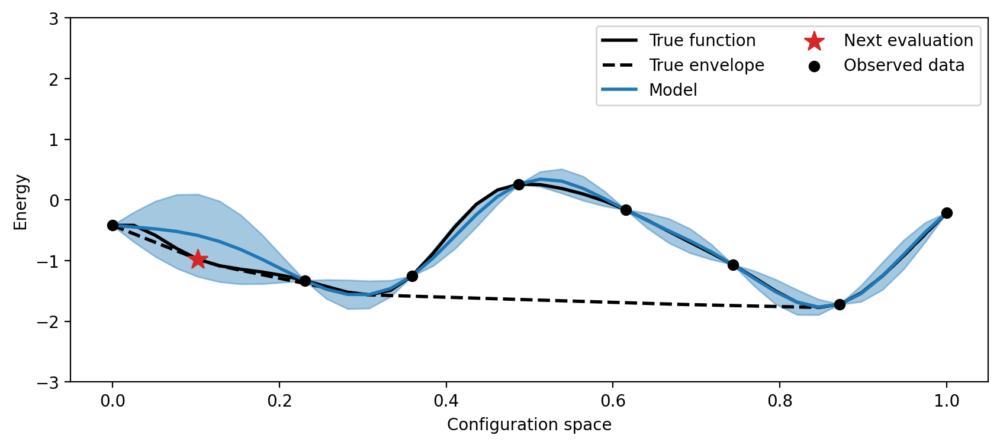

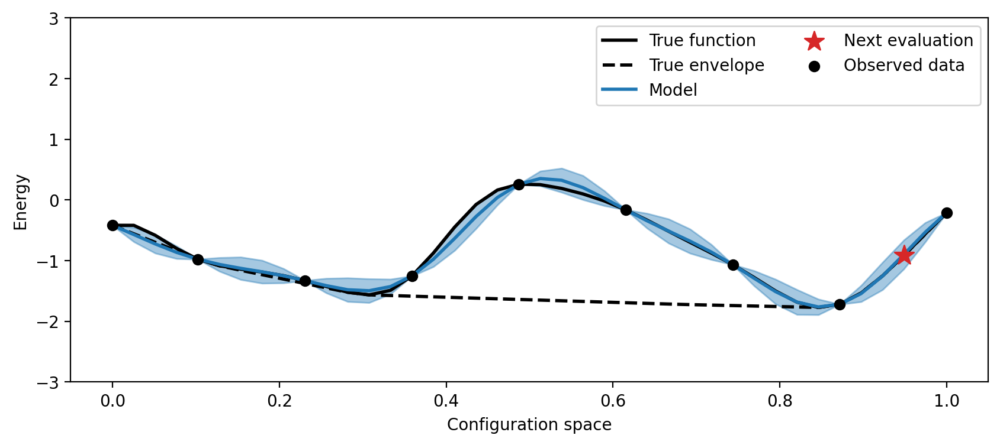

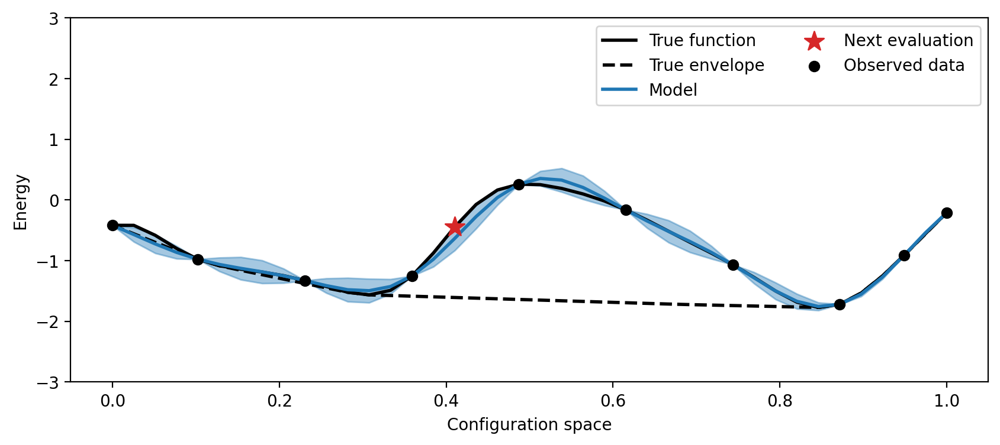

In [81]:
###  baseline

num_iters = 9

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, knot_x)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


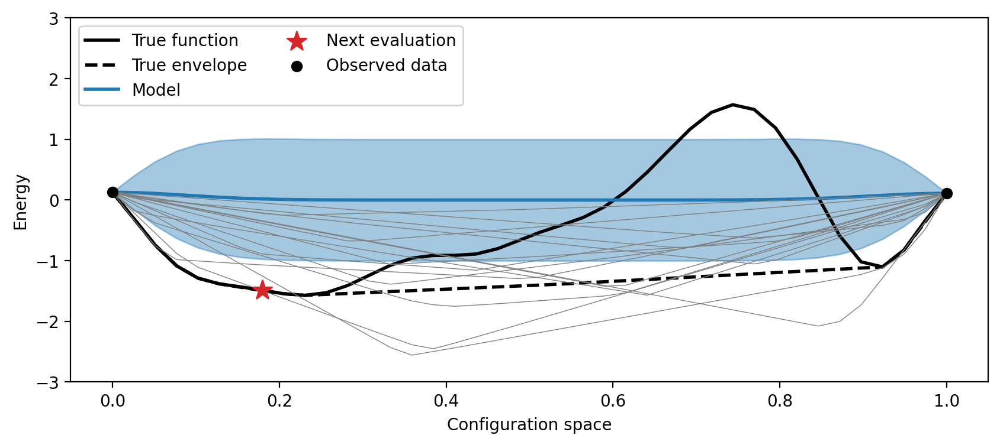

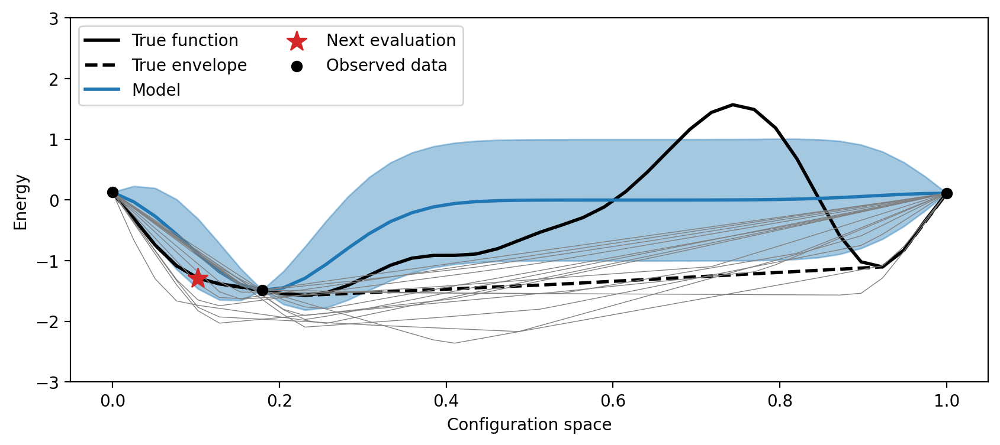

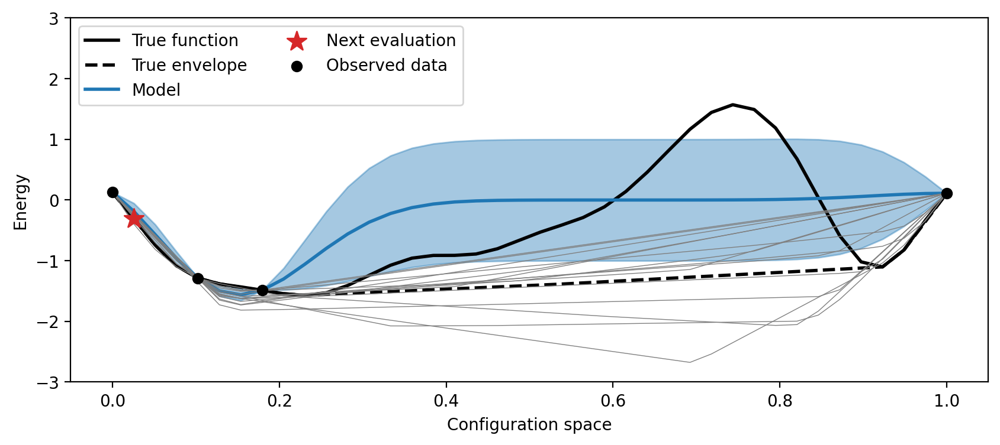

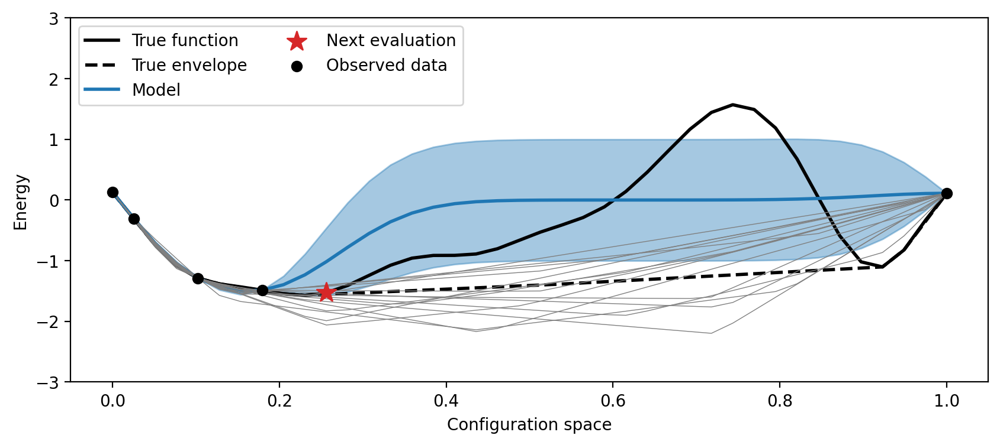

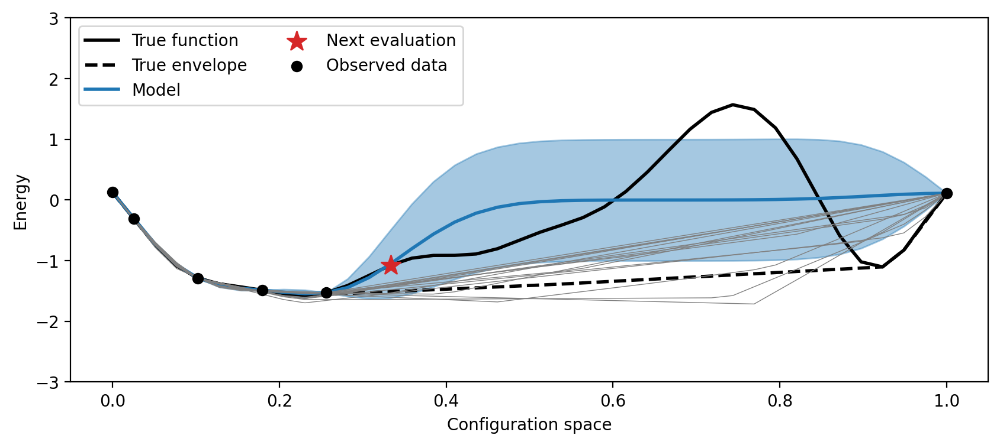

...

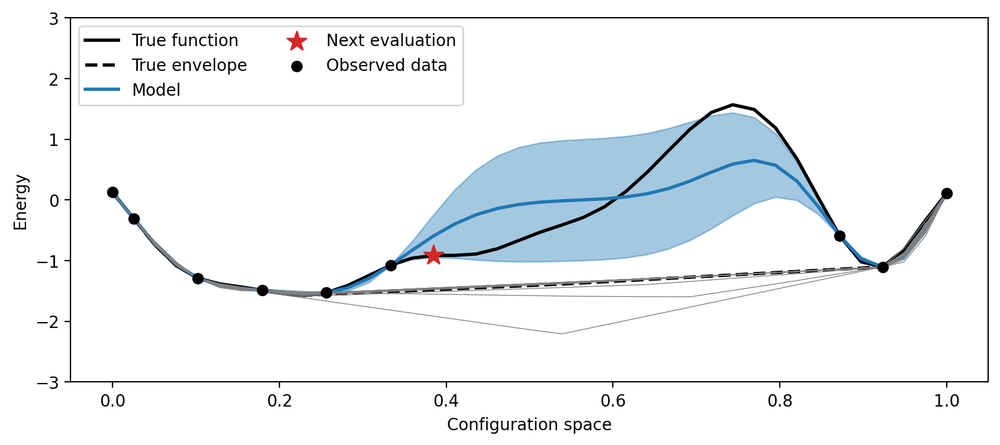

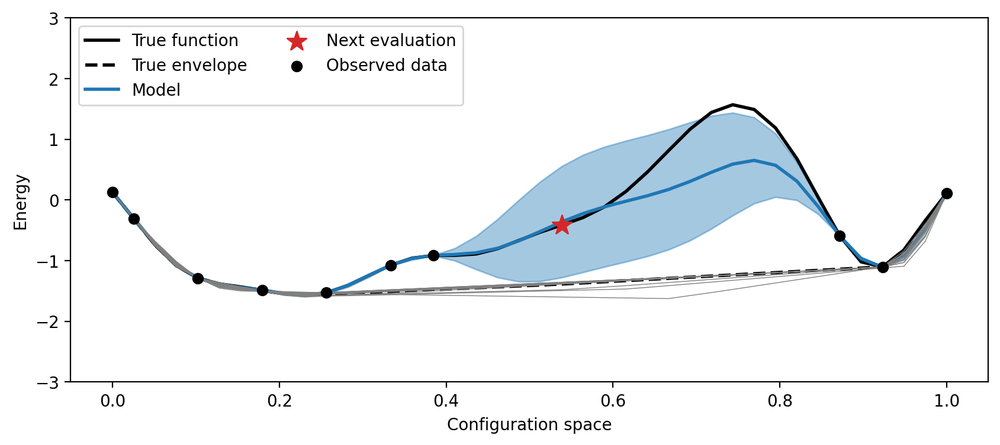

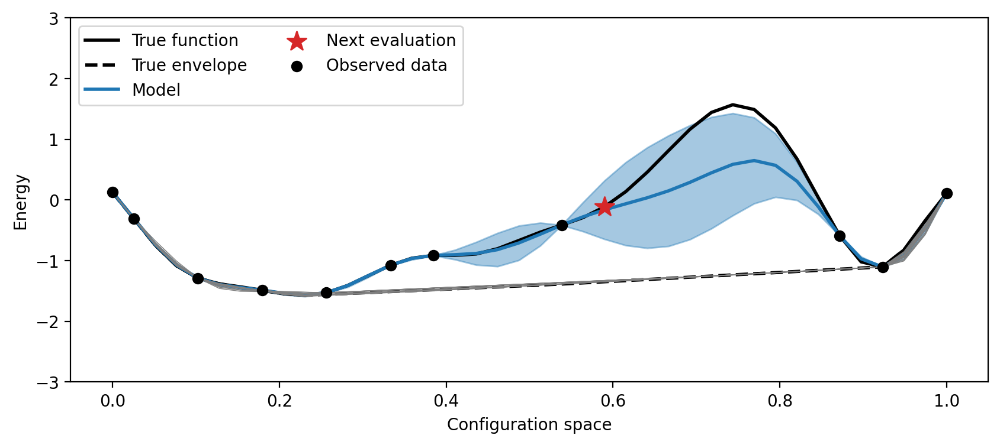

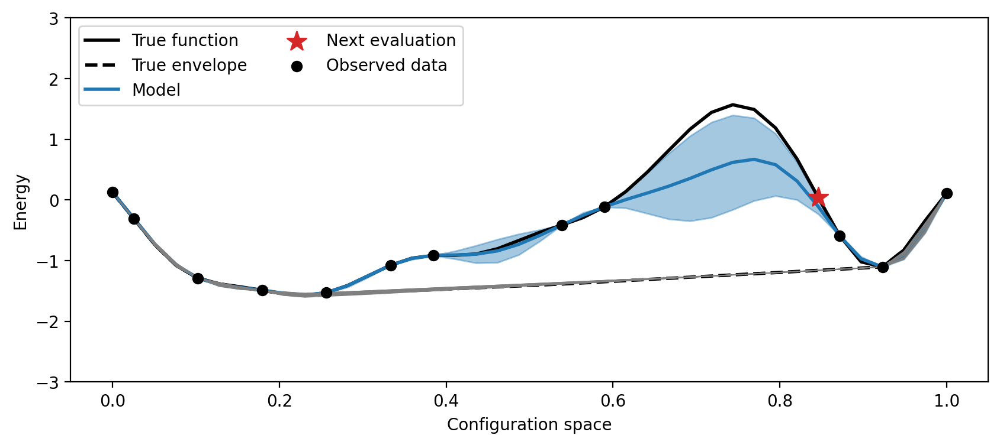

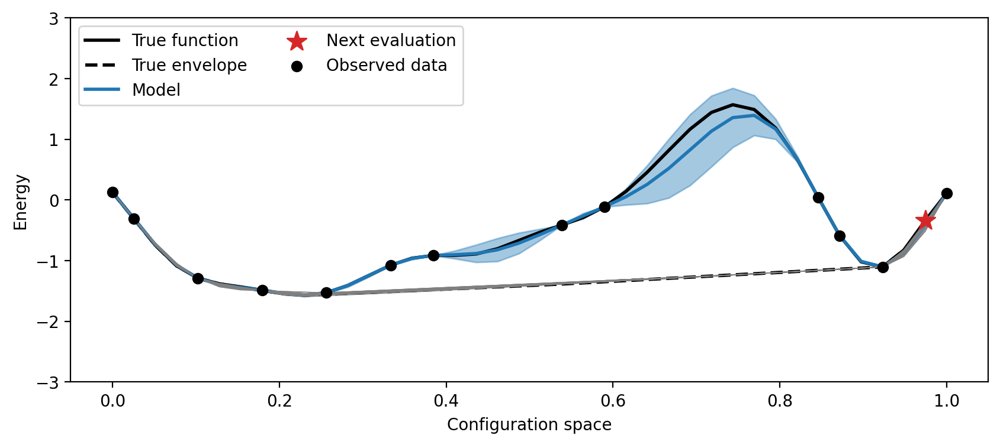

In [8]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

# Plots for ID4 slides

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


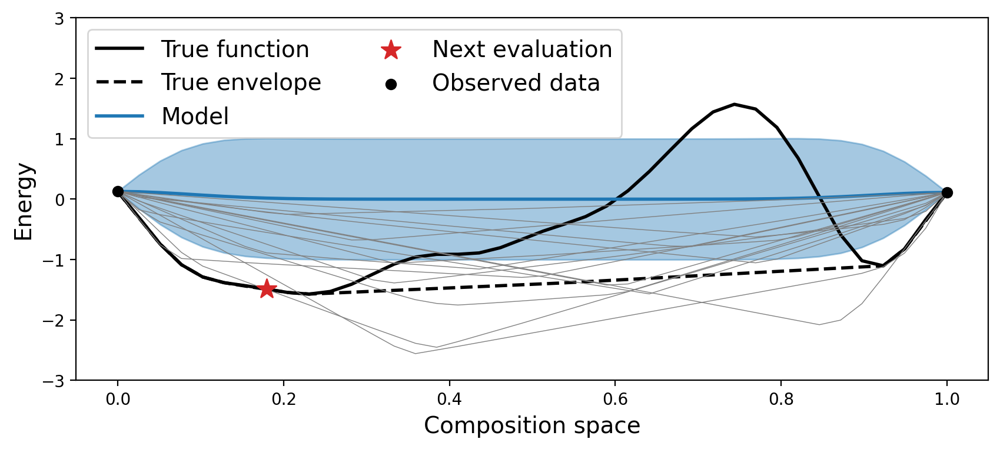

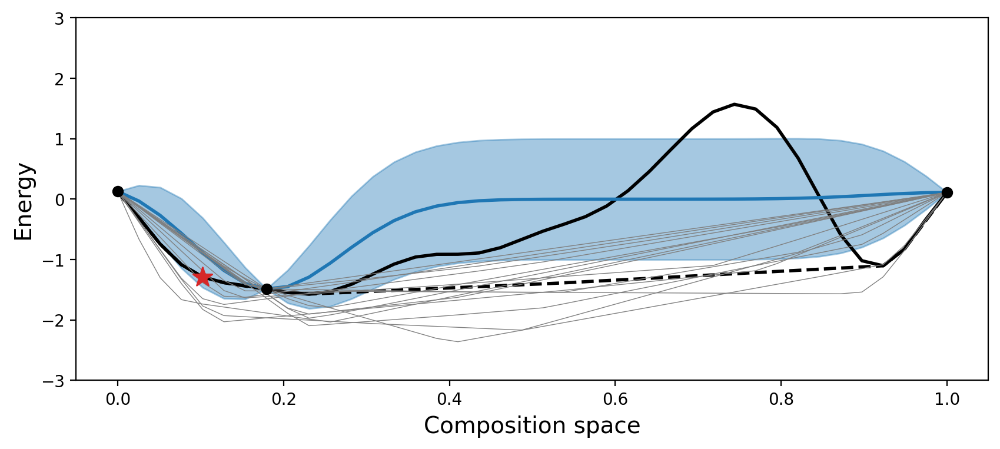

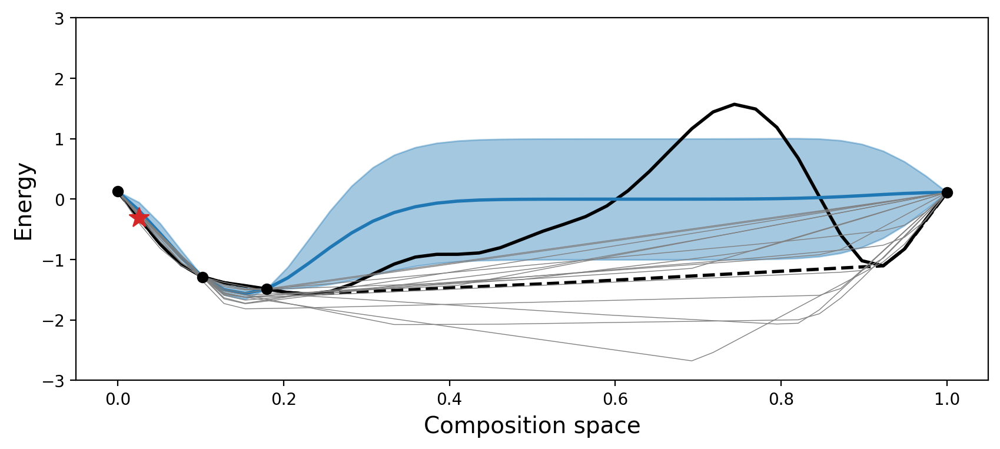

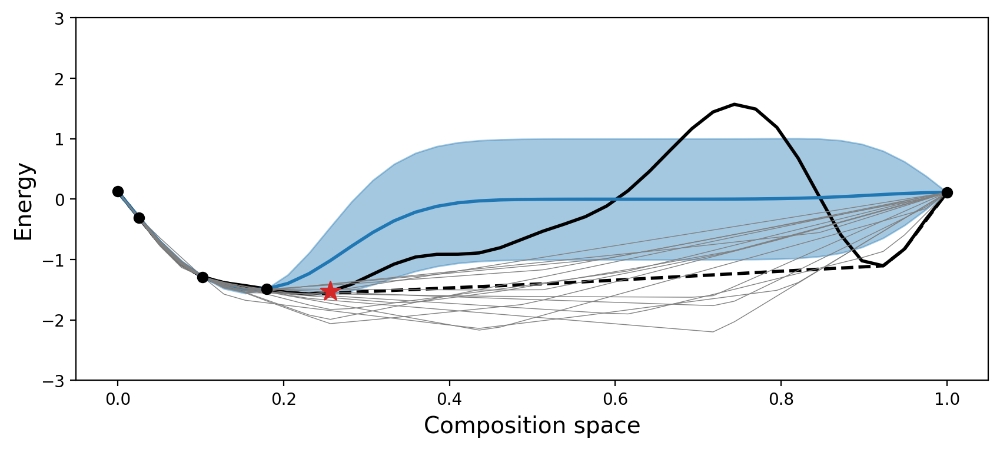

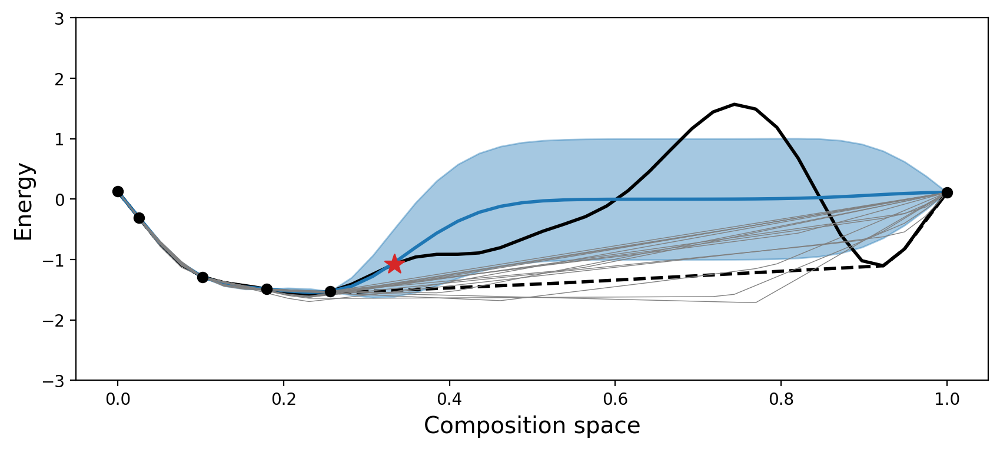

...

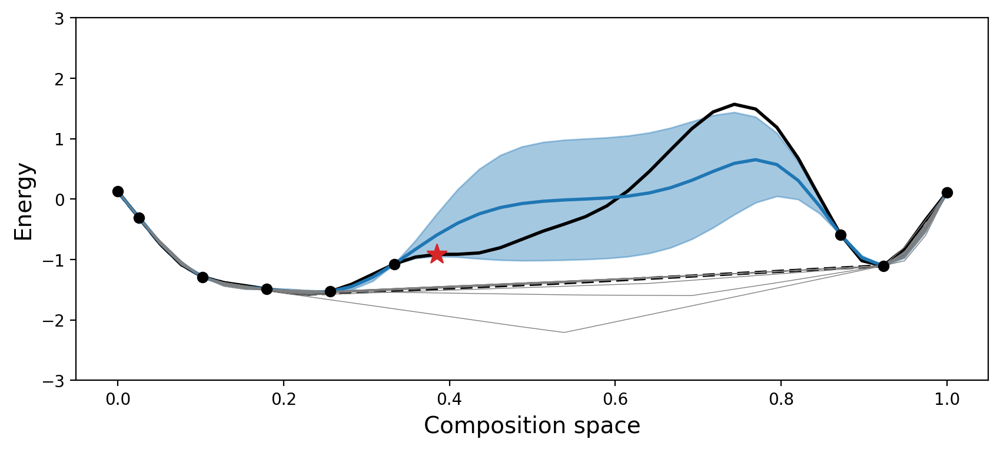

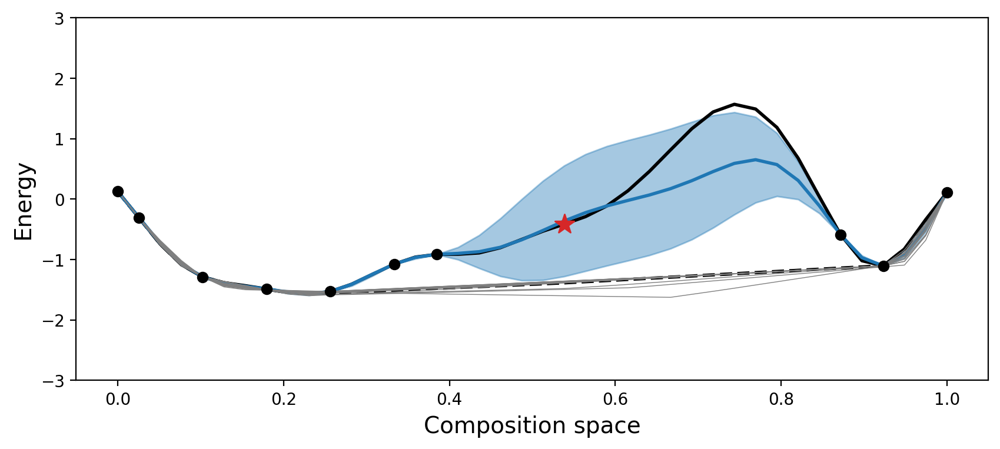

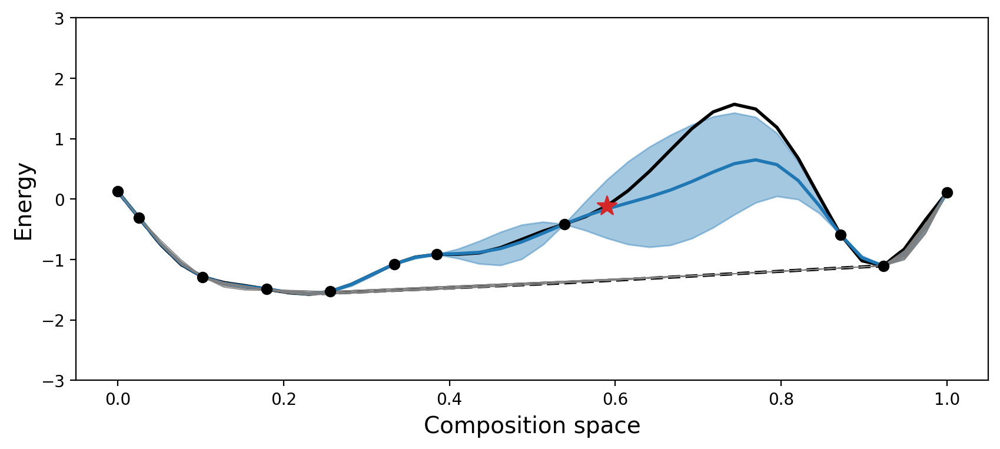

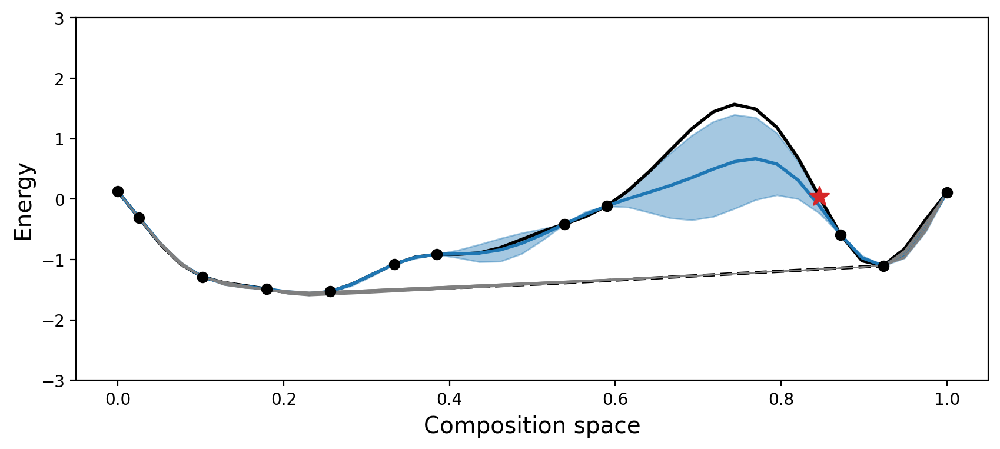

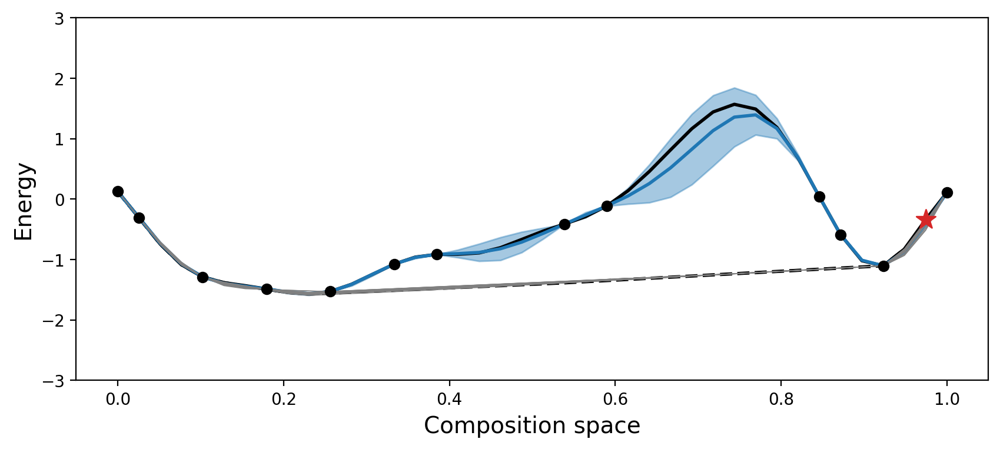

In [17]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, legend=plot_legend)
    plt.savefig(f"figs/test_example_1D_{i}.png", bbox_inches="tight", dpi=300)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

In [14]:
i = 5
f"{i}.png"

'5.png'

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


Array(0.66023888, dtype=float64)

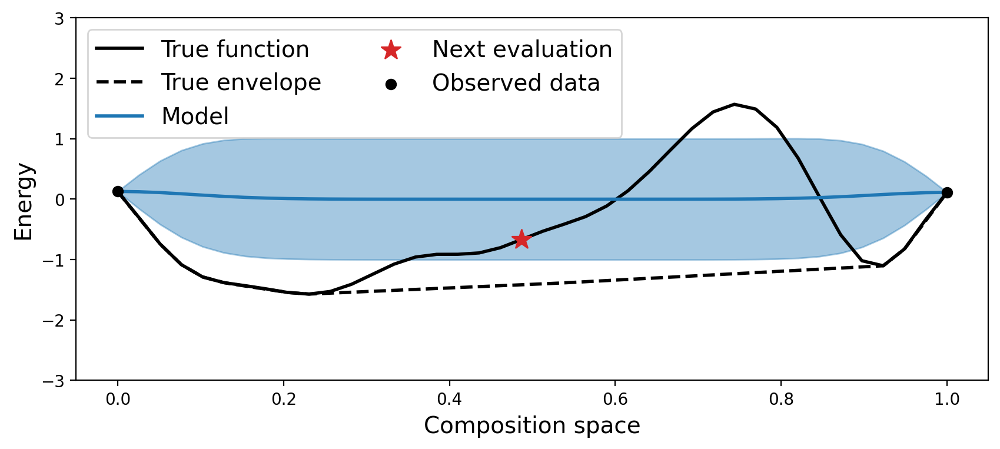

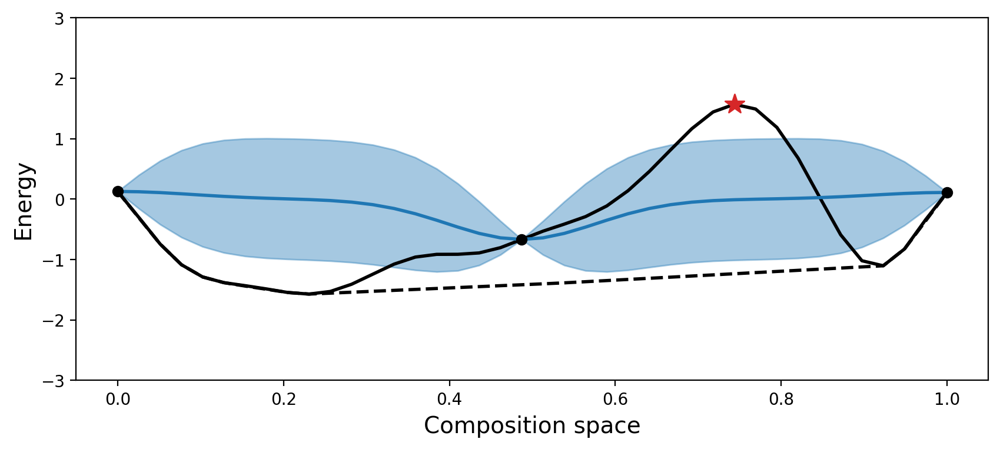

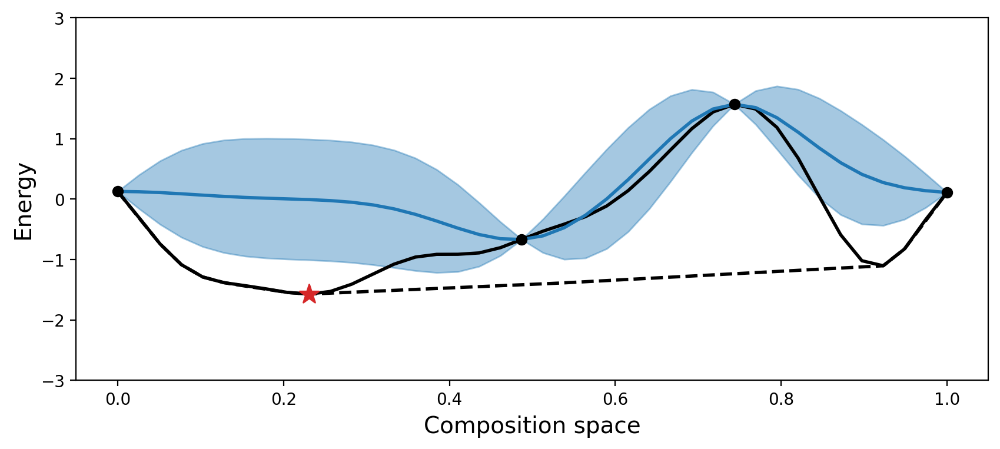

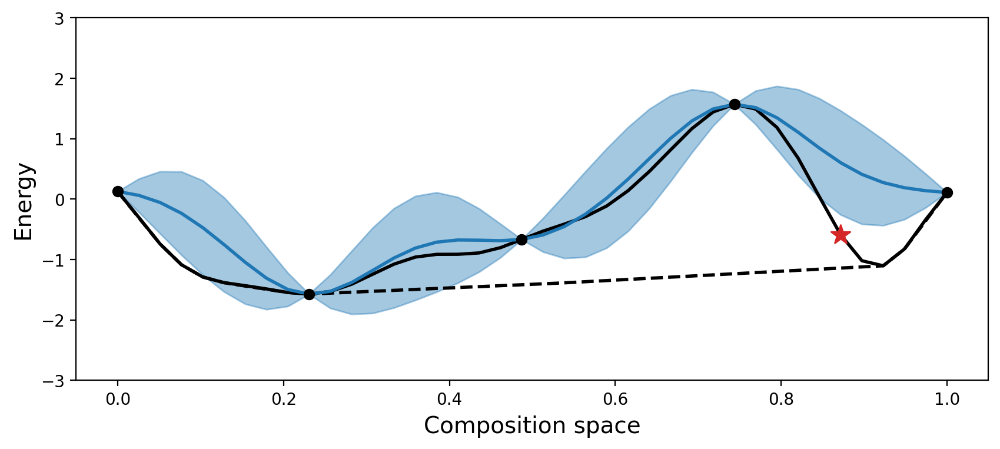

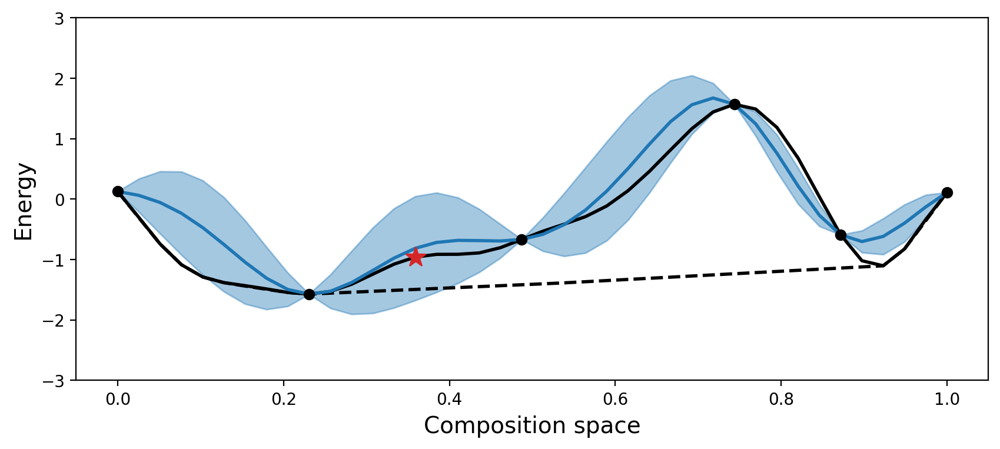

...

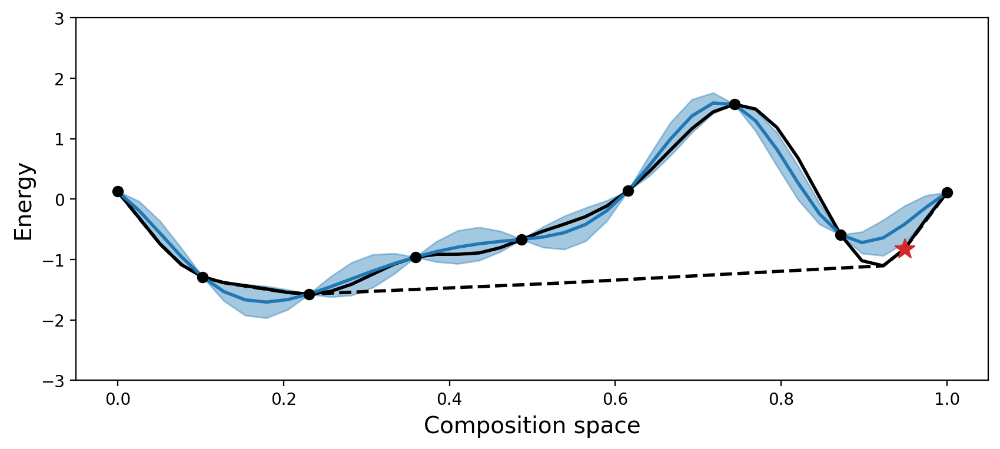

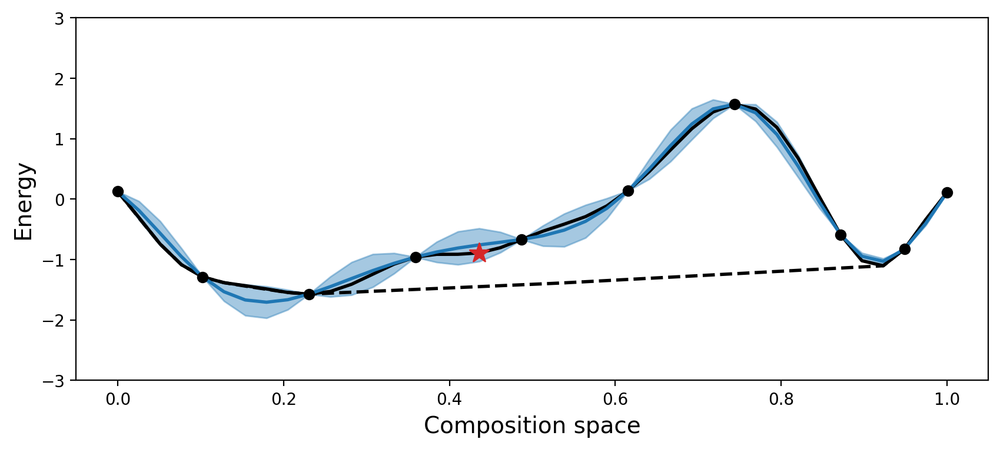

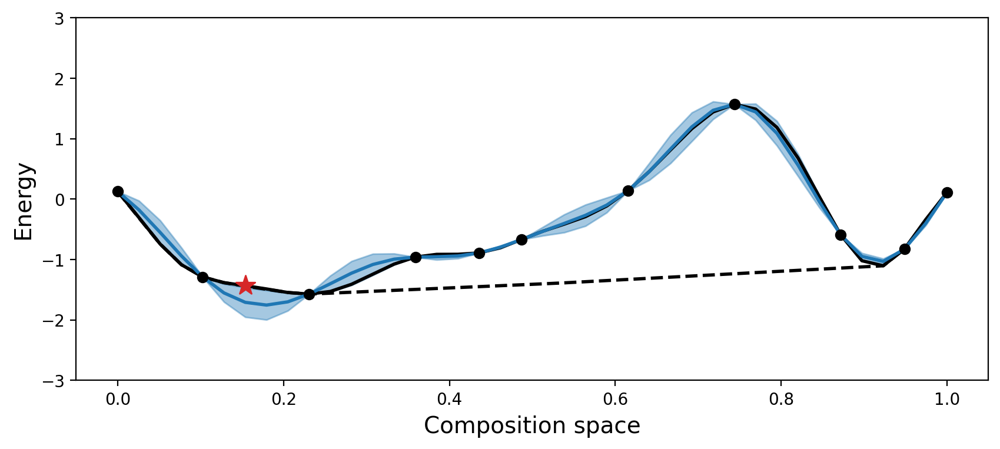

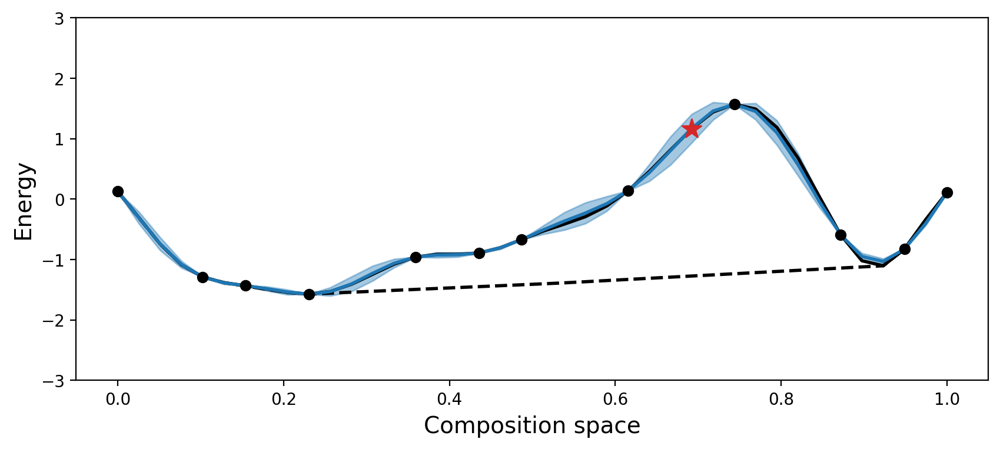

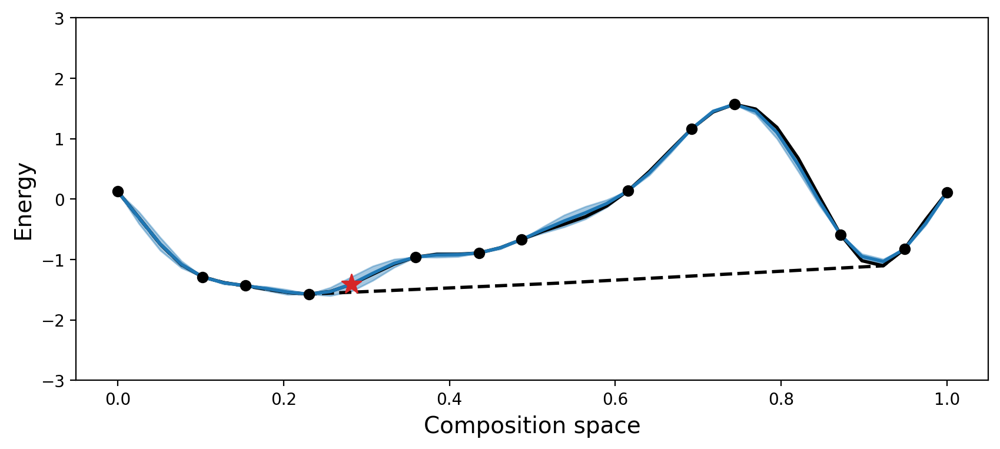

In [19]:
###  baseline

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, knot_x)
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False, legend=plot_legend)
    plt.savefig(f"figs/test_example_1D_baseline_{i}.png", bbox_inches="tight", dpi=300)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

Text(0, 0.5, 'Energy')

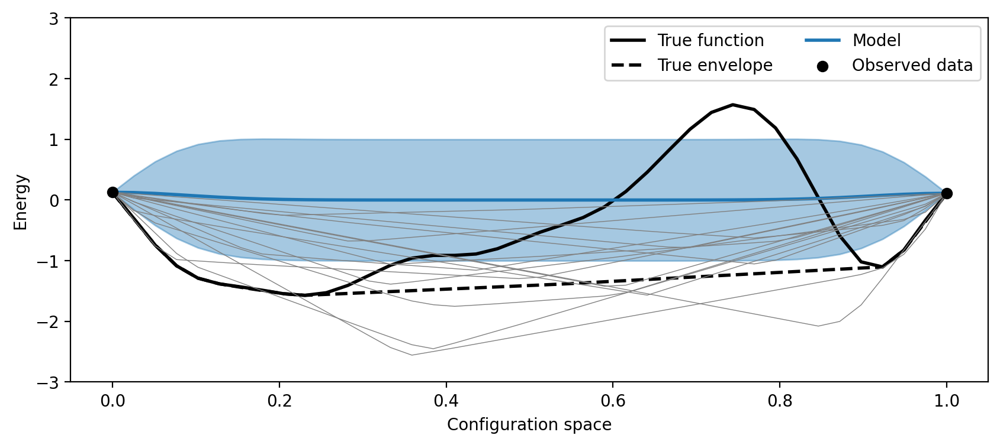

In [16]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)
# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

plt.figure(figsize=(10,4))

# Plot true function, convex hull, and GP model mean + uncertainty
plt.plot(knot_x, true_y, "k", lw=2, label="True function")
plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
y_err = np.sqrt(np.diag(pred_cov)) 
plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
# Plot convex hulls of posterior samples
plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

# Plot data / next evaluation
plt.scatter(train_x, train_y, label="Observed data", c="k", zorder=5)

plt.legend(ncol=2)

plt.ylim(-3,3); plt.xlabel("Configuration space"); plt.ylabel("Energy")

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6


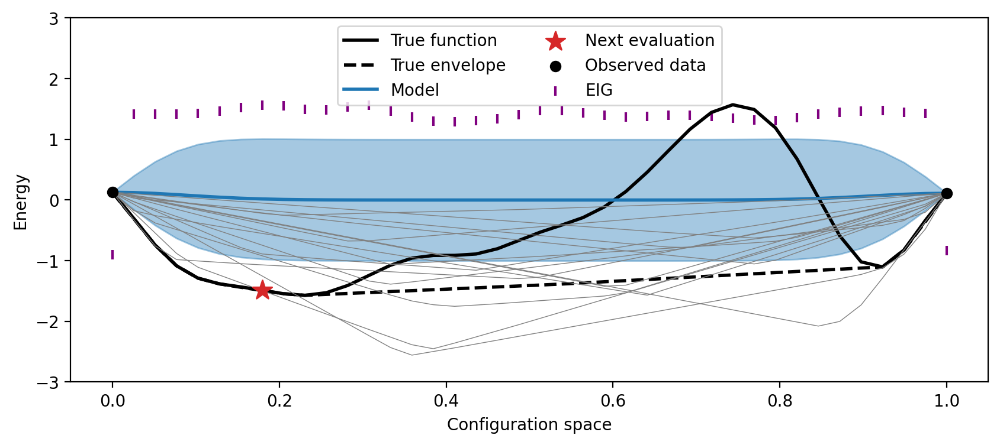

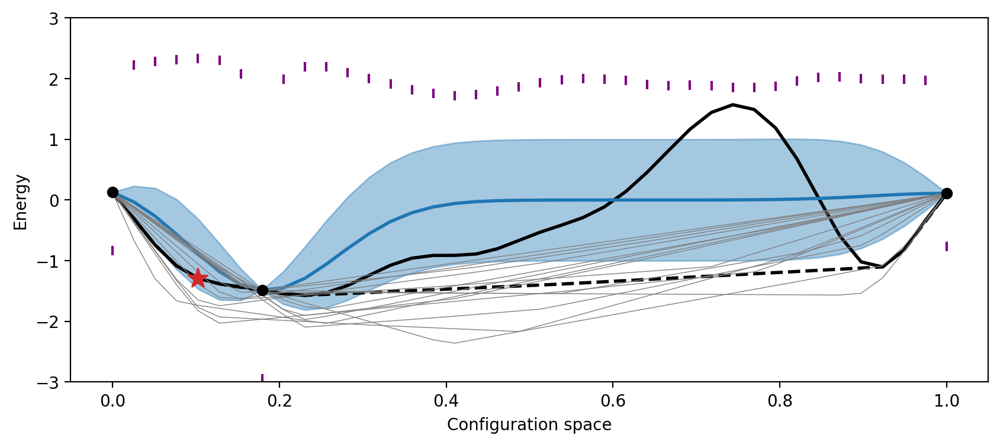

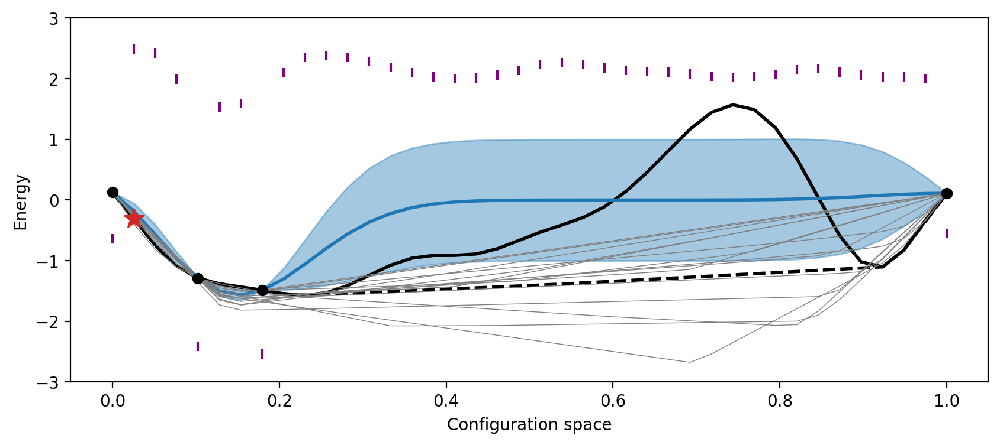

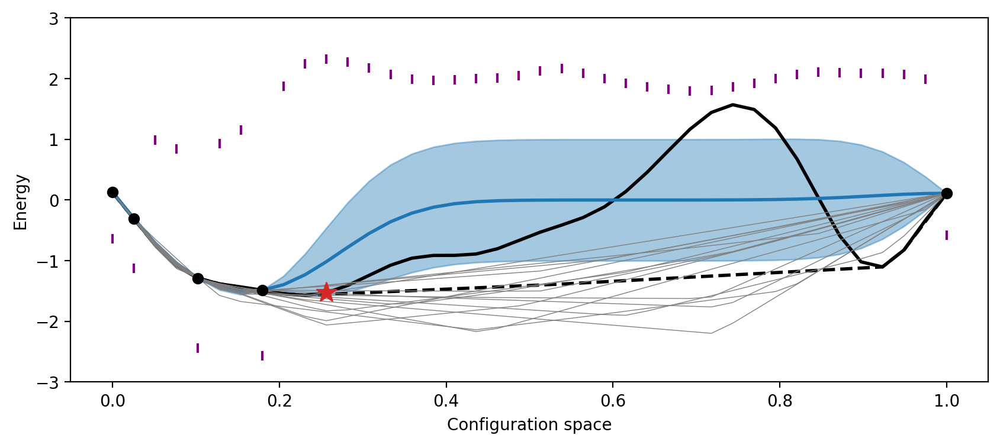

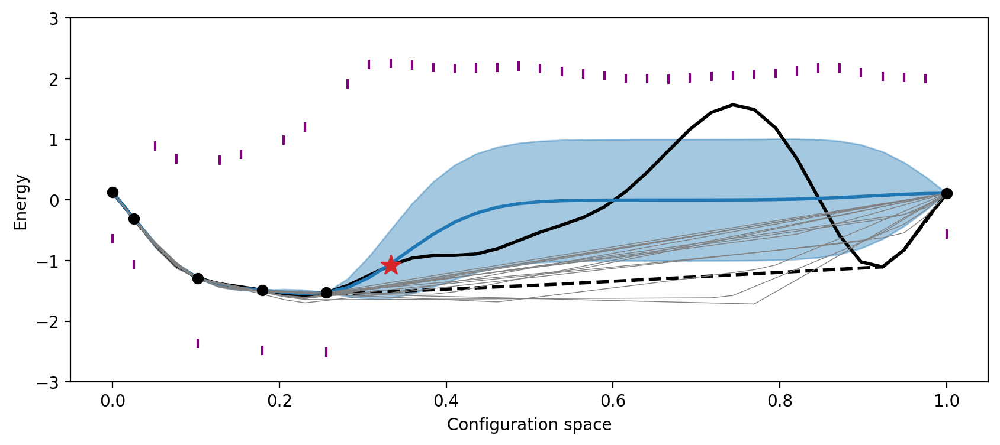

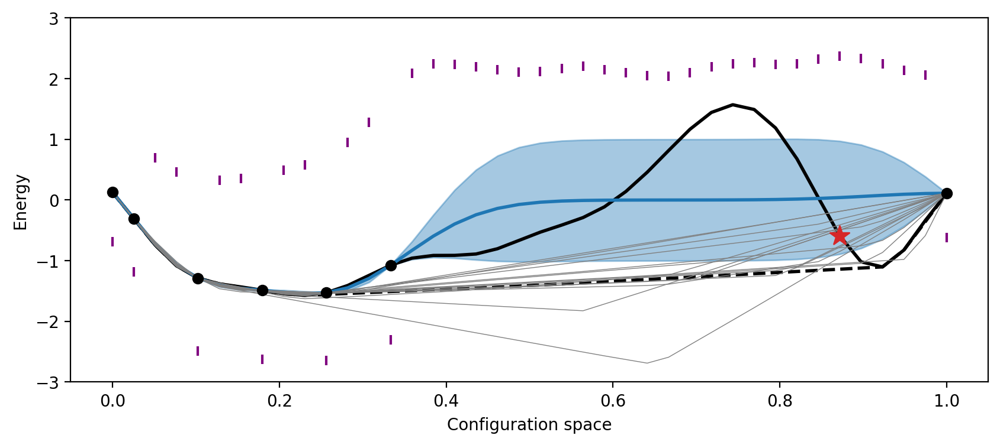

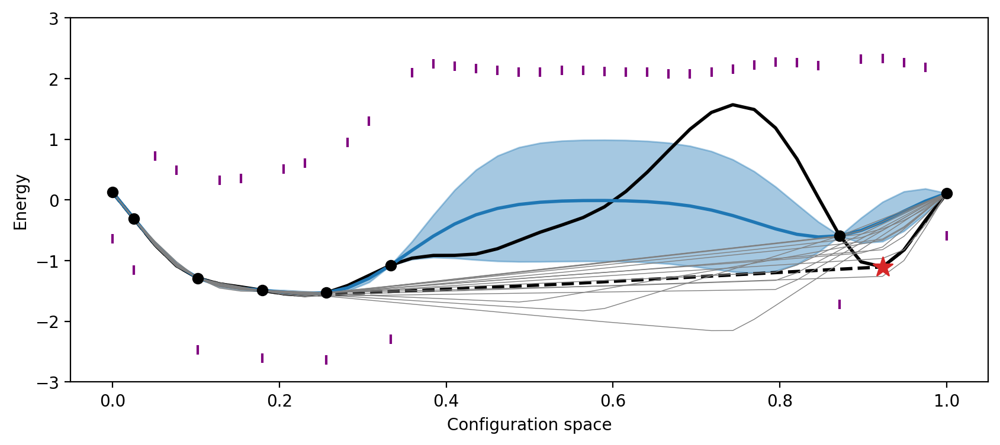

In [20]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 7

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=True, legend=plot_legend)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

In [49]:
compute_distances(data, true_envelope).mean()

DeviceArray(0.11370171, dtype=float64)

In [8]:
# Number of points to discretize the space into
knot_N = 40

# Set random seed
npr.seed(2); rng_key = jrnd.PRNGKey(2)
# Length scale for the kernel
ls = 0.1
true_y, true_envelope = generate_true_function(knot_N, kernel, ls)




# grid to discretize design space into
knot_x = np.linspace(0, 1, knot_N)
#design_space = knot_x[:, np.newaxis]
design_space = knot_x

# Let's imagine that we start out by observing the two end points.
train_x = np.array([design_space[0], design_space[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
# Predict functions over the entire design space
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

In [9]:
pred_cK

Array([[1.41421321e-03, 6.84239381e-04, 6.19980794e-04, ...,
        2.00550398e-23, 1.58221987e-24, 1.36383334e-31],
       [0.00000000e+00, 2.52255827e-01, 4.72654854e-01, ...,
        1.12921768e-18, 9.52214552e-20, 8.87034476e-27],
       [0.00000000e+00, 0.00000000e+00, 8.85734223e-02, ...,
        3.00419908e-17, 2.70786498e-18, 2.72875203e-25],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.69730505e-03, 7.91558019e-03, 1.84391798e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 2.94627040e-03, 7.99216412e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 1.41181183e-03]], dtype=float64)

In [10]:
pred_mean

Array([-4.16757433e-01, -4.03280055e-01, -3.65407043e-01, -3.10022963e-01,
       -2.46296132e-01, -1.83217984e-01, -1.27621953e-01, -8.32394985e-02,
       -5.08370454e-02, -2.90722021e-02, -1.55676241e-02, -7.80572994e-03,
       -3.66481020e-03, -1.61115100e-03, -6.63235738e-04, -2.55651399e-04,
       -9.22780866e-05, -3.12103920e-05, -9.97392077e-06, -3.32917376e-06,
       -2.27045813e-06, -5.13466319e-06, -1.56104467e-05, -4.60494538e-05,
       -1.27555059e-04, -3.30911264e-04, -8.03858156e-04, -1.82849859e-03,
       -3.89454442e-03, -7.76721766e-03, -1.45051114e-02, -2.53643328e-02,
       -4.15310197e-02, -6.36749375e-02, -9.14136899e-02, -1.22885526e-01,
       -1.54681011e-01, -1.82314014e-01, -2.01210150e-01, -2.07934472e-01],      dtype=float64)

In [12]:
pred_cov.shape

(40, 40)